## Investigation of triggered seismicity near Long Valley Caldera due to M8.2 Chignik Earthquake.

Author - Akash Kharita, Final year Geophysics student, Indian Institution of Technology Roorkee,
29 August, 2021 <br>
Licence - Creative Commons Attribution 4.0 (CC-BY) - https://creativecommons.org/licenses/ <br>
You are allowed to share and use the information here as long as you give the appropriate credit. 

#### Long Valley Caldera is an active volcanic system near southern Califonia-Nevada border. There is a history of non-eruptive volcanic swarms in the area. While several mechanisms have been discussed for the origin of these swarms, most prominent one is that earthquake swarms are triggered by the movement of hydrothermal fluids originating from the ancient crystallizing pluton beneath the caldera.<br>

In this jupyter notebook, I will try to investigate the effect of M8.2 Chignik earthquake near Caldera, I will do the following steps - 

1) Download all the available waveform data within 1 degree radius from Long Valley Caldera <br>
2) Rotating the waveforms <br>
3) Observing the filtered waveforms(2-8Hz) and Unfiltered waveforms, selecting the good quality waveforms. <br>
4) Checking for correspondence between surface wave arrival and locally triggered earthquakes. <br>
5) Checking the available event catalog to see the rates of earthquakes swarms before and after the event and also checking for the delayed response. 

In [85]:
## Importing necessary dependencies
import obspy
from obspy import UTCDateTime
from obspy.clients.fdsn import Client
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
from glob import glob
import os
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
import warnings 
warnings.filterwarnings('ignore')

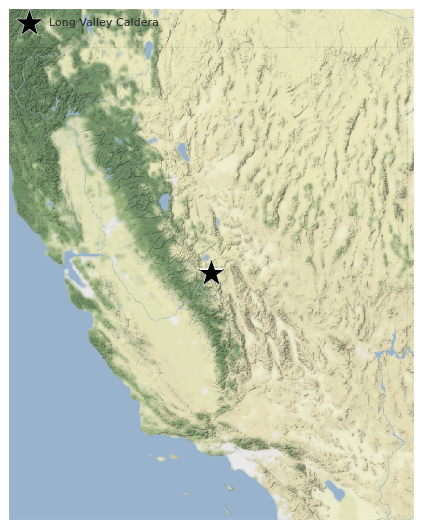

In [87]:
lat,lon = 37.716667, -118.884167  ## Coordinates of the Long Valley Caldera
#%matplotlib notebook
fig = plt.figure(figsize=[8,8])
ax = plt.axes(projection = ccrs.Mercator())
ax.set_extent([lon-5,lon+5,lat-5,lat+5])
#ax.coastlines(resolution='10m')
stamen_terrain = cimgt.Stamen('terrain-background') ##maps.stamen.com
ax.add_image(stamen_terrain,7)
plt.scatter(lon,lat,c='black',marker='*',transform=ccrs.PlateCarree(),label='Long Valley Caldera',s=700)
plt.legend(loc='upper left')
plt.show()

## 1) Downloading the waveforms

Obspy's mass downloader downloads the events from all the available datacentres

In [5]:
import obspy
from obspy.clients.fdsn.mass_downloader import CircularDomain, \
    Restrictions, MassDownloader

origin_time = obspy.UTCDateTime(2021, 7, 29, 6, 15, 49)

# Circular domain around the epicenter. This will download all data between
# 70 and 90 degrees distance from the epicenter. This module also offers
# rectangular and global domains. More complex domains can be defined by
# inheriting from the Domain class.
domain = CircularDomain(latitude=lat, longitude= lon,
                        minradius=0.0, maxradius=1.0)

restrictions = Restrictions(
    # Get data from 5 minutes before the event to one hour after the
    # event. This defines the temporal bounds of the waveform data.
    starttime=origin_time - 0 * 60,
    endtime=origin_time + 3600,
    # You might not want to deal with gaps in the data. If this setting is
    # True, any trace with a gap/overlap will be discarded.
    reject_channels_with_gaps=True,
    # And you might only want waveforms that have data for at least 95 % of
    # the requested time span. Any trace that is shorter than 95 % of the
    # desired total duration will be discarded.
    minimum_length=0.95,
    # No two stations should be closer than 10 km to each other. This is
    # useful to for example filter out stations that are part of different
    # networks but at the same physical station. Settings this option to
    # zero or None will disable that filtering.
    minimum_interstation_distance_in_m=1E3,
    # Only HH or BH channels. If a station has HH channels, those will be
    # downloaded, otherwise the BH. Nothing will be downloaded if it has
    # neither. You can add more/less patterns if you like.
    channel_priorities=["HH[NE]", "BH[NE]"],
    # Location codes are arbitrary and there is no rule as to which
    # location is best. Same logic as for the previous setting.
    location_priorities=["", "00", "10"])

# No specified providers will result in all known ones being queried.
mdl = MassDownloader()
# The data will be downloaded to the ``./waveforms/`` and ``./stations/``
# folders with automatically chosen file names.
mdl.download(domain, restrictions, mseed_storage="waveforms_lv",
             stationxml_storage="stations_lv")

[2021-08-27 20:18:46,111] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for BGR, EMSC, ETH, GEONET, GFZ, ICGC, INGV, IPGP, ISC, KNMI, KOERI, LMU, NCEDC, NIEP, NOA, RESIF, SCEDC, TEXNET, UIB-NORSAR, USGS, USP, ORFEUS, IRIS.
[2021-08-27 20:18:48,713] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'ISC' as it does not have 'dataselect' and/or 'station' services.
[2021-08-27 20:18:49,765] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'EMSC' as it does not have 'dataselect' and/or 'station' services.
[2021-08-27 20:18:50,101] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'USGS' as it does not have 'dataselect' and/or 'station' services.
[2021-08-27 20:18:50,103] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 20 client(s): BGR, ETH, GEONET, GFZ, ICGC, INGV, IPGP, KNMI, KOERI, LMU, NCEDC, NIEP, NOA, RESIF, SCEDC, TEXNET, UIB-NORSAR, USP, ORFEUS, IRIS.
[2021-08-27 20:18:50,114] - obspy.clients.f

[2021-08-27 20:20:06,630] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully downloaded 'stations_lv/NC.MMLB.xml'.
[2021-08-27 20:20:06,907] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully downloaded 'stations_lv/NC.MINS.xml'.
[2021-08-27 20:20:09,385] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully downloaded 'stations_lv/NN.LHV.xml'.
[2021-08-27 20:20:09,851] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully downloaded 'stations_lv/NC.MLI.xml'.
[2021-08-27 20:20:10,688] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully downloaded 'stations_lv/NC.MDY.xml'.
[2021-08-27 20:20:12,541] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Successfully downloaded 'stations_lv/NN.WAK.xml'.
[2021-08-27 20:20:12,600] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Downloaded 13 station files [0.4 MB] in 14.5 seconds [28.25 KB/sec].
[2021-08-27 2

[2021-08-27 20:22:11,713] - obspy.clients.fdsn.mass_downloader - INFO: Client 'BGR' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-27 20:22:11,715] - obspy.clients.fdsn.mass_downloader - INFO: Client 'BGR' - Acquired 0 StationXML files [0.0 MB].
[2021-08-27 20:22:11,718] - obspy.clients.fdsn.mass_downloader - INFO: Client 'ETH' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-27 20:22:11,719] - obspy.clients.fdsn.mass_downloader - INFO: Client 'ETH' - Acquired 0 StationXML files [0.0 MB].
[2021-08-27 20:22:11,720] - obspy.clients.fdsn.mass_downloader - INFO: Client 'GEONET' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-27 20:22:11,721] - obspy.clients.fdsn.mass_downloader - INFO: Client 'GEONET' - Acquired 0 StationXML files [0.0 MB].
[2021-08-27 20:22:11,722] - obspy.clients.fdsn.mass_downloader - INFO: Client 'GFZ' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-27 20:22:11,724] - obspy.clients.fdsn.mass_downloader - INFO: Client 'GFZ' - Acquired 0 StationXML files [0.0 MB].
[2021-08-2

{'BGR': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd0543081f0>,
 'ETH': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df7bee0>,
 'GEONET': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df2ee50>,
 'GFZ': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd0a400dac0>,
 'ICGC': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df2eee0>,
 'INGV': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df2ef70>,
 'IPGP': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df2efa0>,
 'KNMI': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df2ed90>,
 'KOERI': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fd07df2ecd0>,
 'LMU': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownlo

### Loading the event waveforms and station information

In [5]:
sfiles = os.listdir('waveforms_lv')
s = []
for i in range(len(sfiles)):
    s += obspy.read('waveforms_lv//'+sfiles[i])

s = obspy.Stream(s)

In [6]:
sfiles = os.listdir('stations_lv')
inv = []
for i in range(len(sfiles)):
    inv += obspy.read_inventory('stations_lv//'+sfiles[i])

inv = obspy.Inventory(inv)

In [7]:
s_north = s.select(channel='*HN')
s_east = s.select(channel='*HE')
s_z = s.select(channel='*HZ')
stn_lats = []
stn_lons = []
stns = []
for i in range(len(inv)):
    stn_lats.append(inv[i][0][0].latitude)
    stn_lons.append(inv[i][0][0].longitude)
    stns.append(s_north[i].stats.station)

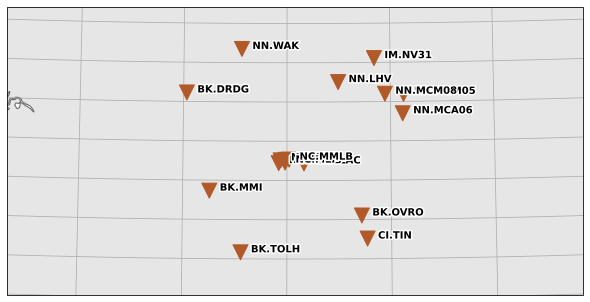

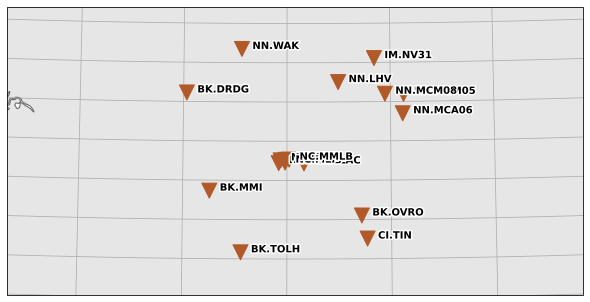

In [10]:
plt.rcParams['figure.figsize'] = 10,5
inv.plot(projection='local',resolution="f",show=False)

In [11]:
from obspy.geodetics import gps2dist_azimuth
dist  = []
ba = []
lat_eq,lon_eq = 55.474, -157.917
for i in range(len(stn_lats)):
    b = gps2dist_azimuth(stn_lats[i],stn_lons[i],lat_eq,lon_eq)
    dist.append(b[0])
    ba.append(b[1])

### 2) Rotating the event waveforms

In [12]:
s_rotate = []
for i in range(len(stns)):
    AC = s.select(station=stns[i]) 
    s_rotate += AC.rotate(method='NE->RT',back_azimuth=ba[i])
s_rotate = obspy.Stream(s_rotate)
s_T = s_rotate.select(channel='*HT')
s_R = s_rotate.select(channel='*HR')

In [13]:
s_t = s_T.copy()
t = np.linspace(0,3600,len(s_t[0].data))
s_t.trim(starttime = s_t[0].stats.starttime+t[np.argmax(s_t[0].data)]-10*60,endtime = s_t[0].stats.starttime+t[np.argmax(s_t[0].data)]+15*60)
s_t_f = s_t.copy()
s_t_f.filter(type='bandpass',freqmin=2,freqmax=8)

17 Trace(s) in Stream:
BK.DRDG.00.HHT | 2021-07-29T06:20:58.790470Z - 2021-07-29T06:45:58.790470Z | 100.0 Hz, 150001 samples
BK.MMI.00.HHT  | 2021-07-29T06:20:58.790470Z - 2021-07-29T06:45:58.790470Z | 100.0 Hz, 150001 samples
BK.OVRO.00.HHT | 2021-07-29T06:20:58.793130Z - 2021-07-29T06:45:58.793130Z | 100.0 Hz, 150001 samples
BK.TOLH.00.HHT | 2021-07-29T06:20:58.790469Z - 2021-07-29T06:45:58.790469Z | 100.0 Hz, 150001 samples
CI.MLAC..HHT   | 2021-07-29T06:20:58.788300Z - 2021-07-29T06:45:58.788300Z | 100.0 Hz, 150001 samples
CI.TIN..HHT    | 2021-07-29T06:20:58.788393Z - 2021-07-29T06:45:58.788393Z | 100.0 Hz, 150001 samples
IM.NV31..BHT   | 2021-07-29T06:20:58.800000Z - 2021-07-29T06:45:58.800000Z | 40.0 Hz, 60001 samples
NC.MDPB..HHT   | 2021-07-29T06:20:58.795000Z - 2021-07-29T06:45:58.795000Z | 100.0 Hz, 150001 samples
NC.MDY..HHT    | 2021-07-29T06:20:58.790000Z - 2021-07-29T06:45:58.790000Z | 100.0 Hz, 150001 samples
NC.MINS..HHT   | 2021-07-29T06:20:58.790000Z - 2021-07-29T06:

In [14]:
s_r = s_R.copy()
t = np.linspace(0,3600,len(s_r[0].data))
s_r.trim(starttime = s_r[0].stats.starttime+t[np.argmax(s_r[0].data)]-10*60,endtime = s_r[0].stats.starttime+t[np.argmax(s_r[0].data)]+15*60)
s_r_f = s_r.copy()
s_r_f.filter(type='bandpass',freqmin=2,freqmax=8)

17 Trace(s) in Stream:
BK.DRDG.00.HHR | 2021-07-29T06:21:14.860470Z - 2021-07-29T06:46:14.860470Z | 100.0 Hz, 150001 samples
BK.MMI.00.HHR  | 2021-07-29T06:21:14.860470Z - 2021-07-29T06:46:14.860470Z | 100.0 Hz, 150001 samples
BK.OVRO.00.HHR | 2021-07-29T06:21:14.863130Z - 2021-07-29T06:46:14.863130Z | 100.0 Hz, 150001 samples
BK.TOLH.00.HHR | 2021-07-29T06:21:14.860469Z - 2021-07-29T06:46:14.860469Z | 100.0 Hz, 150001 samples
CI.MLAC..HHR   | 2021-07-29T06:21:14.858300Z - 2021-07-29T06:46:14.858300Z | 100.0 Hz, 150001 samples
CI.TIN..HHR    | 2021-07-29T06:21:14.858393Z - 2021-07-29T06:46:14.858393Z | 100.0 Hz, 150001 samples
IM.NV31..BHR   | 2021-07-29T06:21:14.850000Z - 2021-07-29T06:46:14.850000Z | 40.0 Hz, 60001 samples
NC.MDPB..HHR   | 2021-07-29T06:21:14.865000Z - 2021-07-29T06:46:14.865000Z | 100.0 Hz, 150001 samples
NC.MDY..HHR    | 2021-07-29T06:21:14.860000Z - 2021-07-29T06:46:14.860000Z | 100.0 Hz, 150001 samples
NC.MINS..HHR   | 2021-07-29T06:21:14.860000Z - 2021-07-29T06:

### 3) Plotting the filtered and unfiltered waveforms to look for correspondence between surface waves and locally triggered earthquakes and to select the best quality data


#### Plotting Transverse component

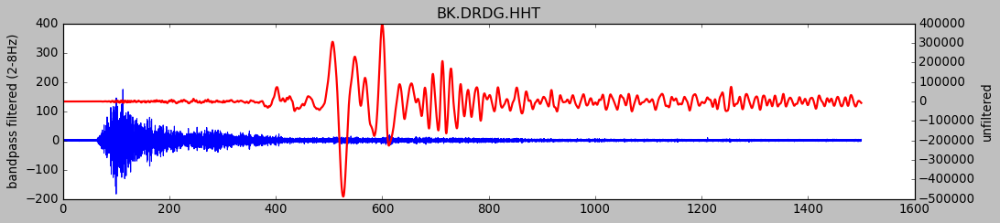

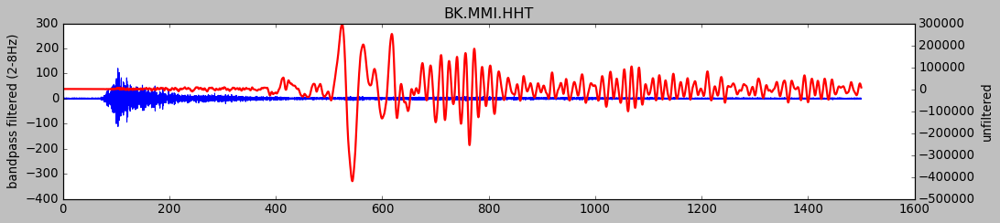

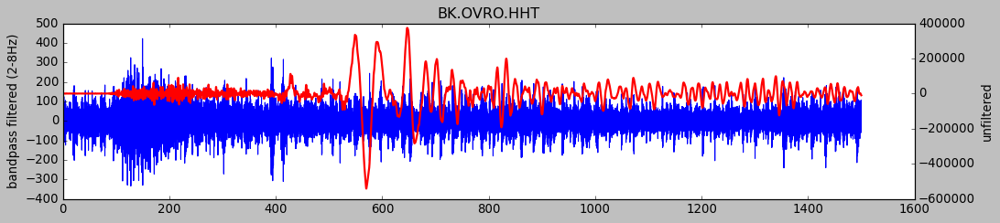

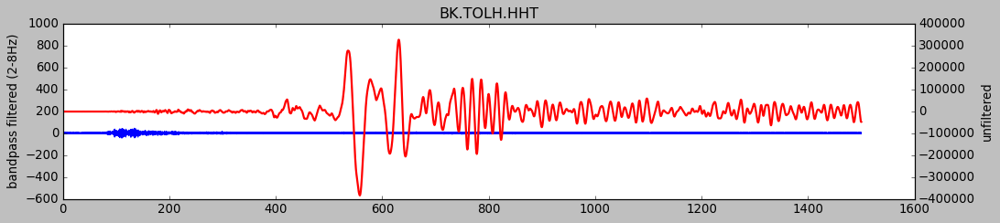

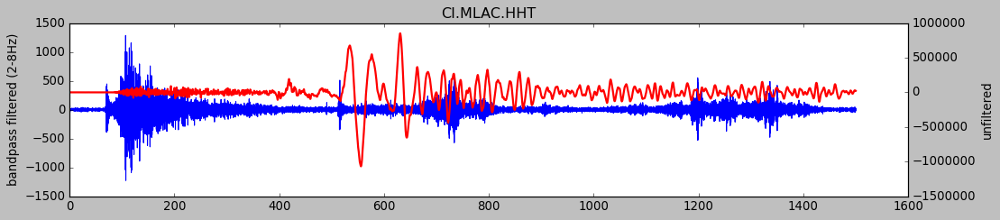

...

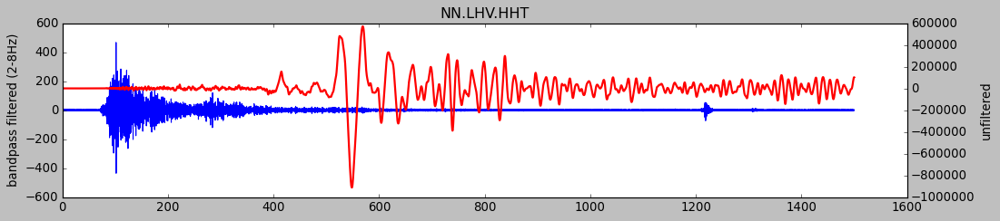

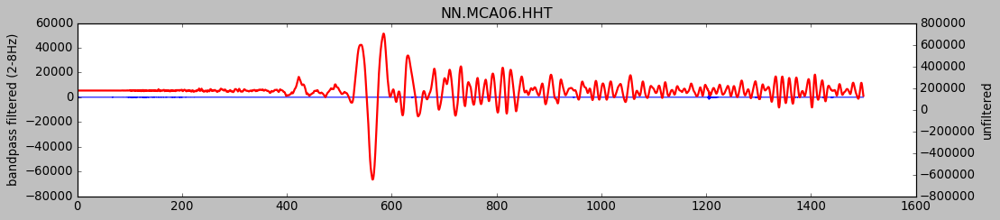

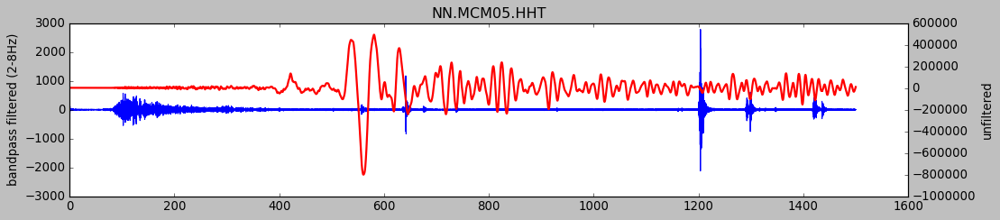

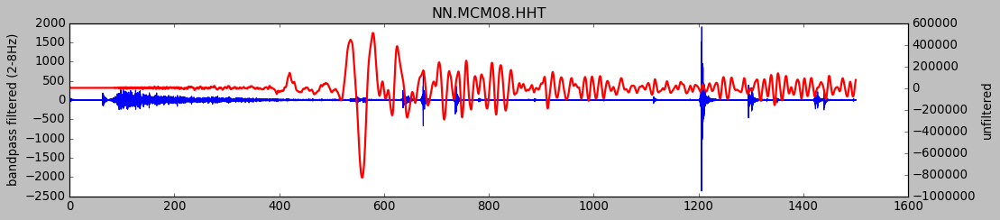

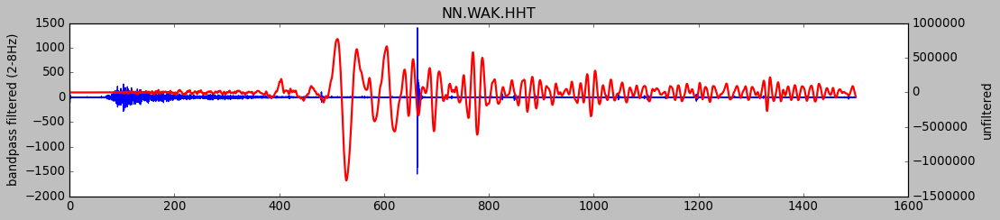

In [15]:
plt.style.use('classic')
for i in range(len(s_t)):
    fig = plt.figure(figsize=[15,3])
    ax1 = fig.add_subplot(111)
    t = np.linspace(0,len(s_t[i].data)*s_t[i].stats.delta,len(s_t[i].data))
    ax1.plot(t,s_t_f[i].data)
    ax1.set_ylabel('bandpass filtered (2-8Hz)')
    #ax1.set_xlim(0,t[-1])
    ax2 = ax1.twinx()
    ax2.plot(t,s_t[i],'r-',label='unfiltered',LineWidth=2)
    ax2.set_ylabel('unfiltered')
    #ax2.set_xlim(700,1200)
    plt.title(s_t[i].stats.network+'.'+s_t[i].stats.station+'.'+s_t[i].stats.channel)

#### Plotting the Radial component

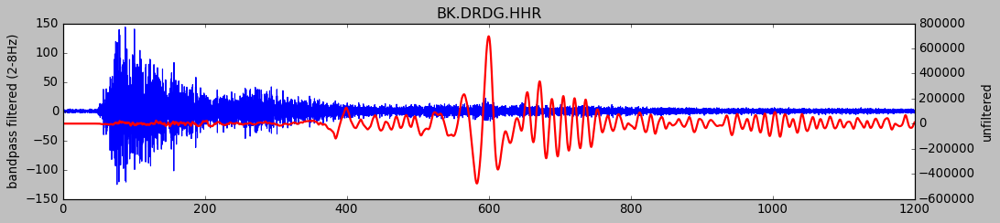

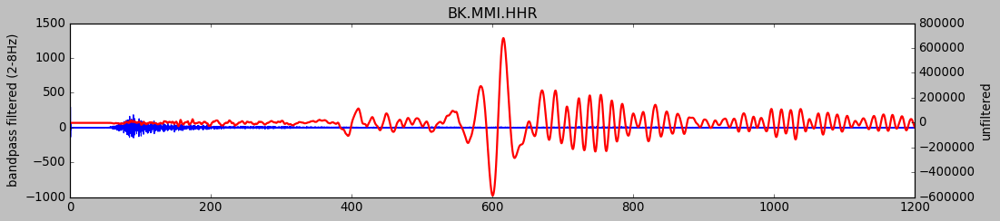

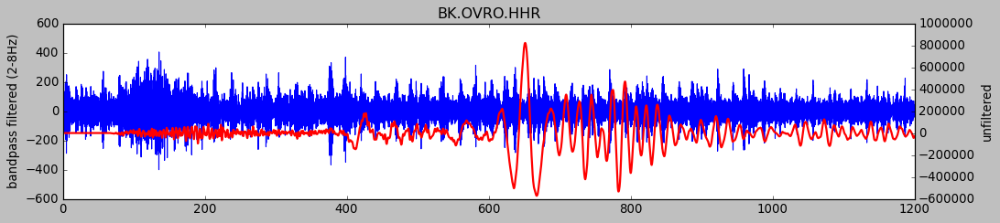

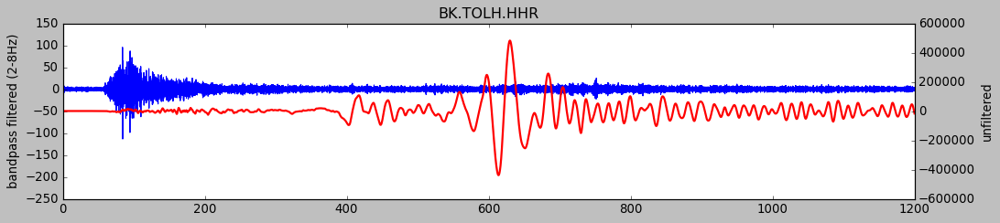

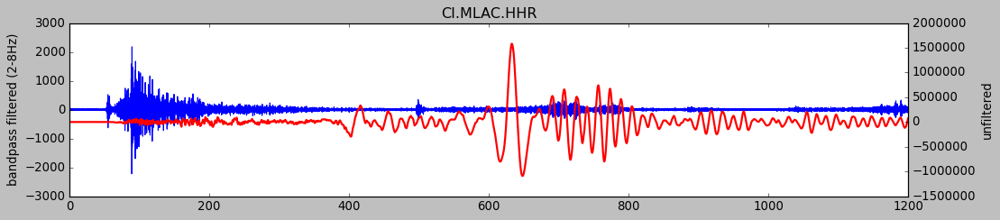

...

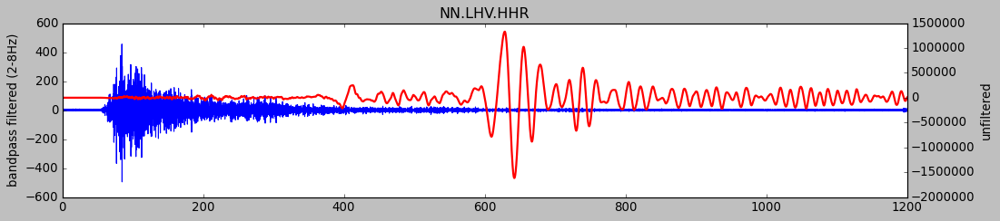

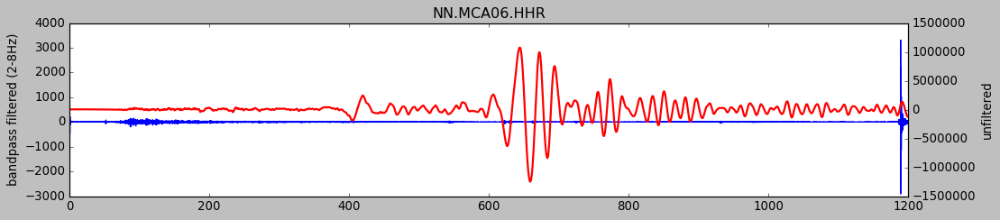

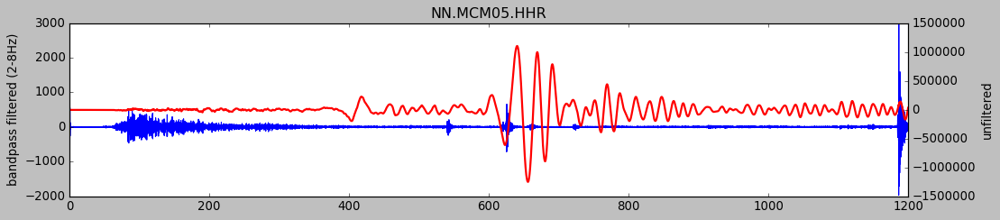

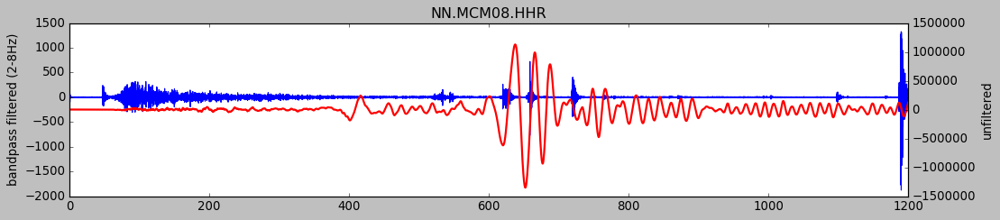

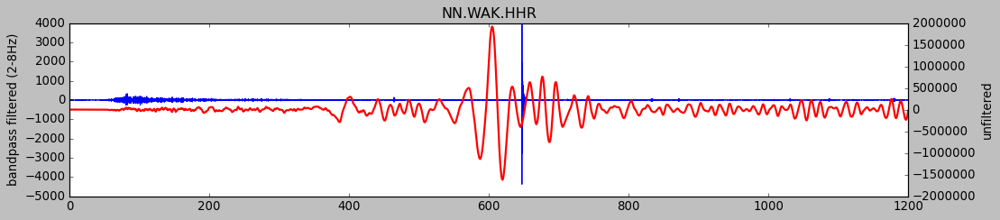

In [16]:
plt.style.use('classic')
for i in range(len(s_r)):
    fig = plt.figure(figsize=[15,3])
    ax1 = fig.add_subplot(111)
    t = np.linspace(0,len(s_r[i].data)*s_r[i].stats.delta,len(s_r[i].data))
    ax1.plot(t,s_r_f[i].data)
    ax1.set_ylabel('bandpass filtered (2-8Hz)')
    #ax1.set_xlim(0,t[-1])
    ax2 = ax1.twinx()
    ax2.plot(t,s_r[i],'r-',label='unfiltered',LineWidth=2)
    ax2.set_ylabel('unfiltered')
    ax2.set_xlim(0,1200)
    plt.title(s_r[i].stats.network+'.'+s_r[i].stats.station+'.'+s_r[i].stats.channel)

In [17]:
for i in range(len(stn_lats)):
    s_t[i].stats.distance = dist[i]
    s_t[i].stats.latitude = stn_lats[i]
    s_t[i].stats.longitude = stn_lons[i]
    s_r[i].stats.distance = dist[i]
    s_r[i].stats.latitude = stn_lats[i]
    s_r[i].stats.longitude = stn_lons[i]

### Ok, looks like there are few stations of our interest! these stations showed the presence of triggered events and had less noise and good data quality

In [64]:
s_t_good = []
s_r_good = []
s_t_f_good = []
s_r_f_good = []

sta_list = ['MLAC','NV31','TIN','MDPB','MCM08','MCM05','OVRO','MCA06']
for sta in sta_list:
    s_t_good += s_t.select(station=sta)
    s_r_good += s_r.select(station=sta)
    s_t_f_good += s_t_f.select(station=sta)
    s_r_f_good += s_r_f.select(station=sta)
    
s_t_good = obspy.Stream(s_t_good)
s_r_good = obspy.Stream(s_r_good)
s_t_f_good = obspy.Stream(s_t_f_good)
s_r_f_good = obspy.Stream(s_r_f_good)

In [65]:
stn_lats_good = []
stn_lons_good = []
for i in range(len(s_t_good)):
    stn_lats_good.append(s_t_good[i].stats.latitude)
    stn_lons_good.append(s_t_good[i].stats.longitude)

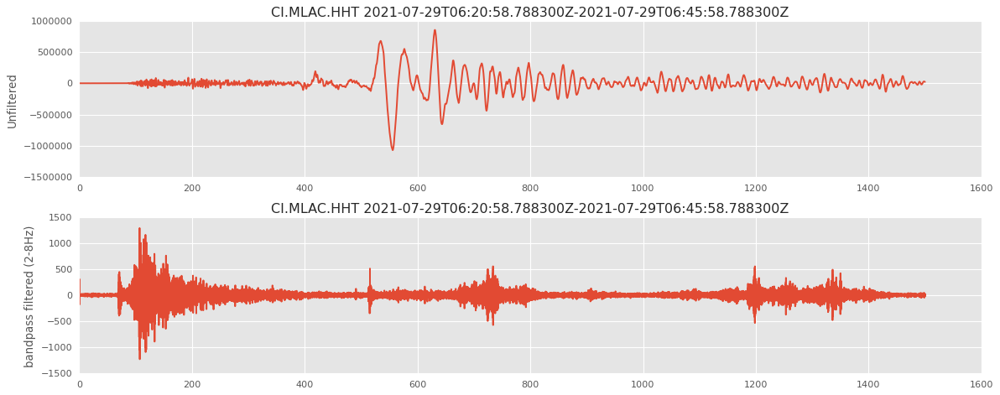

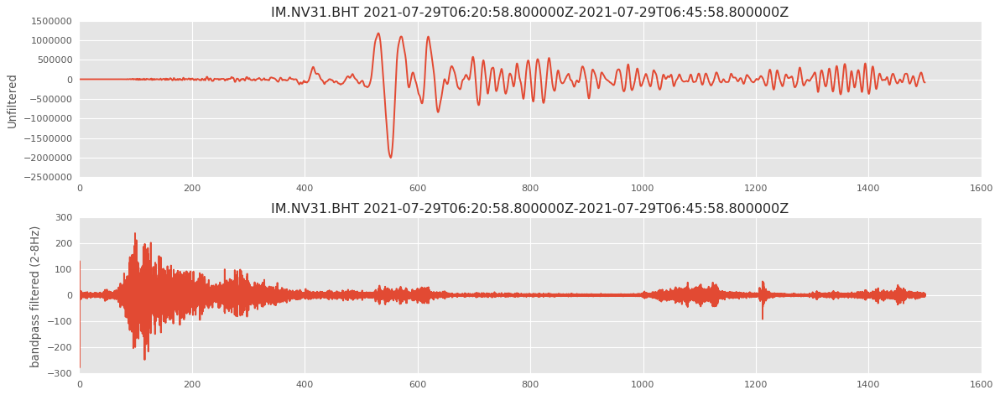

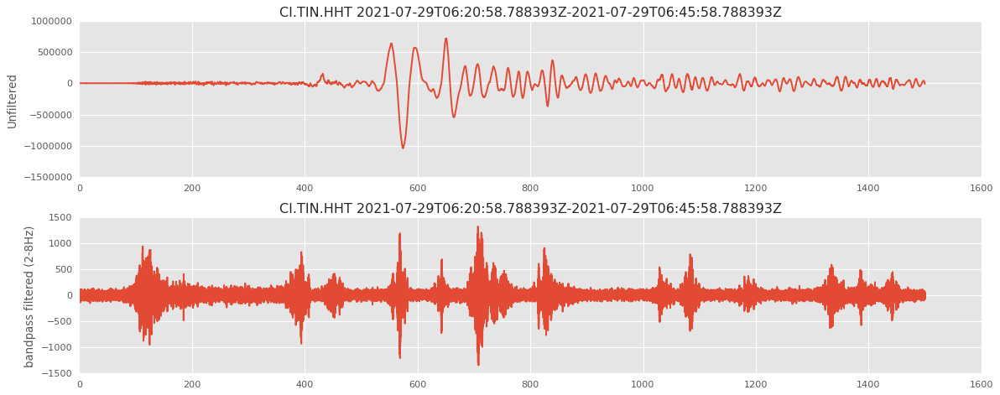

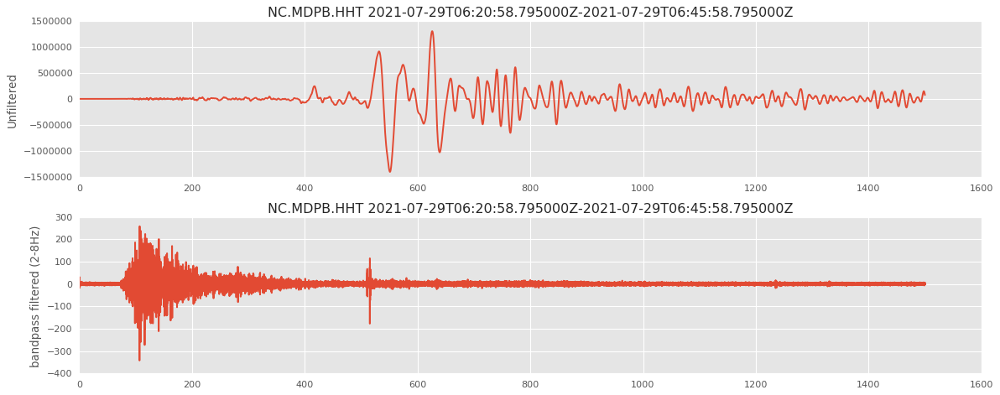

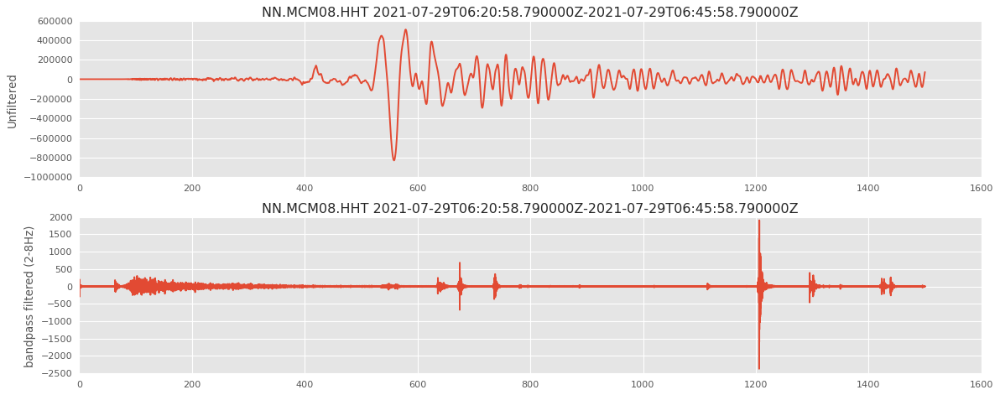

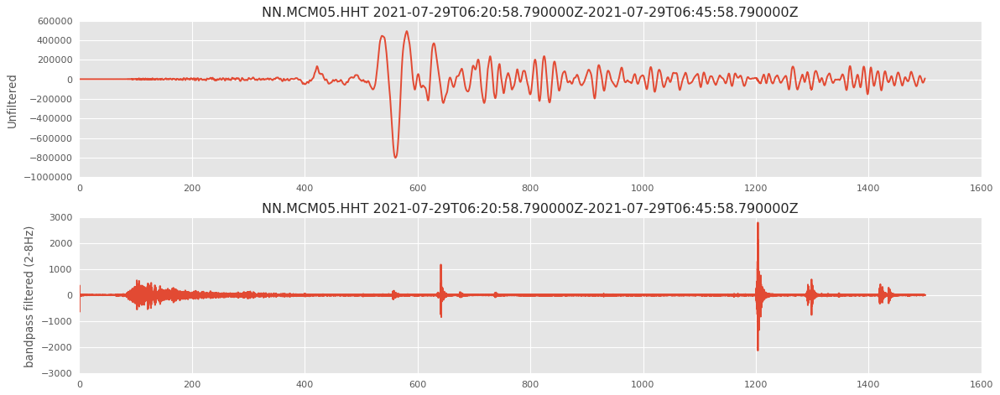

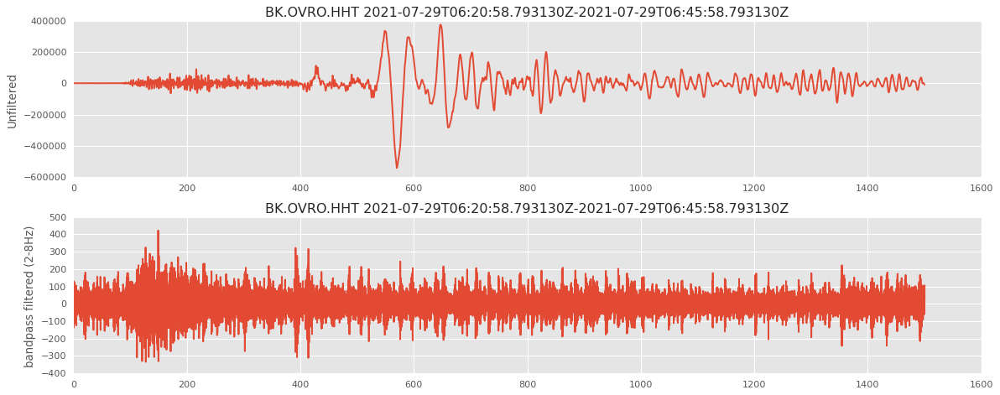

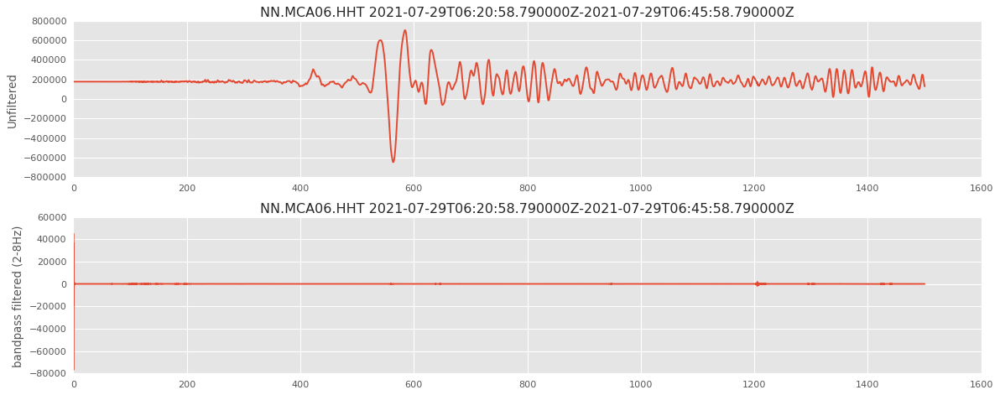

In [53]:
plt.style.use('ggplot')
for i in range(len(s_t_f_good)):
    fig,ax1 = plt.subplots(2,1,figsize=[15,6])
    t = np.linspace(0,len(s_t_f_good[i].data)*s_t_f_good[i].stats.delta,len(s_t_f_good[i].data))
    #ax1.set_xlim(t[np.argmax(s_n_f[i].data[500:-1])]-200,t[np.argmax(s_n_f[i].data[500:-1])]+200)
    #ax1[1].set_xlim(500,1200)
    ax1[1].plot(t,s_t_f_good[i].data)
    ax1[1].set_ylabel('bandpass filtered (2-8Hz)')
    ax1[1].set_title(s_t_f_good[i].stats.network+'.'+s_t_f_good[i].stats.station+'.'+s_t_f_good[i].stats.channel+' '+
             str(s_t_f_good[i].stats.starttime)+'-'+str(s_t_f_good[i].stats.endtime))
    #ax1[0].set_xlim(500,1200)
    ax1[0].plot(t,s_t_good[i].data)
    ax1[0].set_ylabel('Unfiltered')
    ax1[0].set_title(s_t_good[i].stats.network+'.'+s_t_good[i].stats.station+'.'+s_t_good[i].stats.channel+' '+
             str(s_t_good[i].stats.starttime)+'-'+str(s_t_good[i].stats.endtime))
    fig.tight_layout()

### There are few stations which show the arrival of triggered seismicity exactly at the time of arrival of Rayleigh waves but they could be a part of a previous ongoing swarm. to investigate this in more detail, we need to watch their spectrograms in more detail. Below are the spectrograms of 1 hour in length

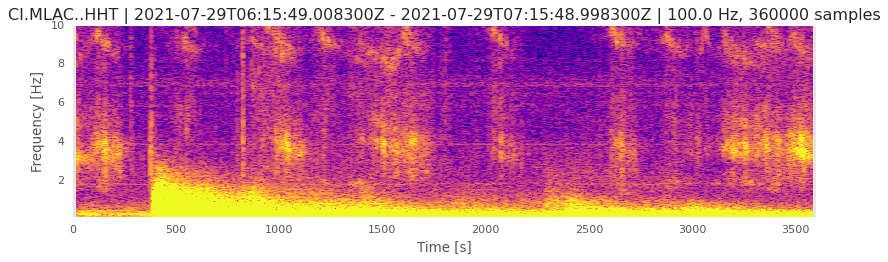

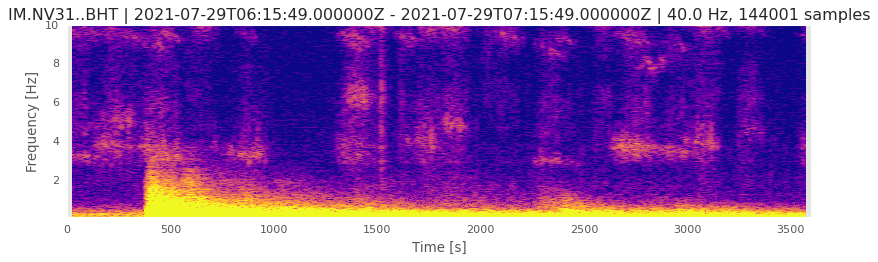

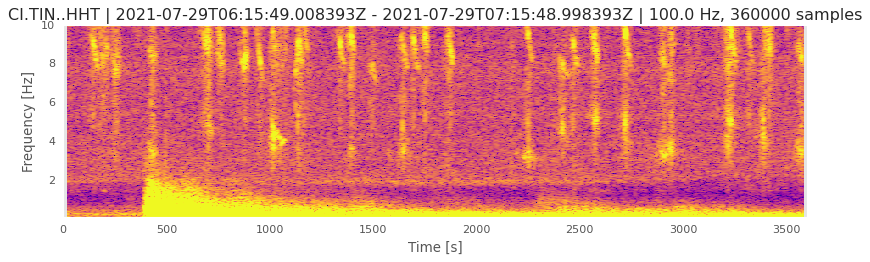

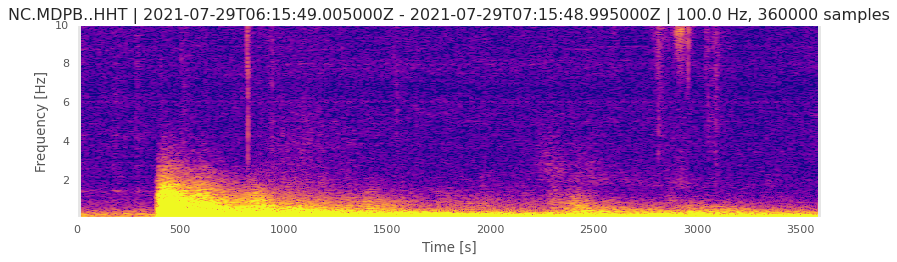

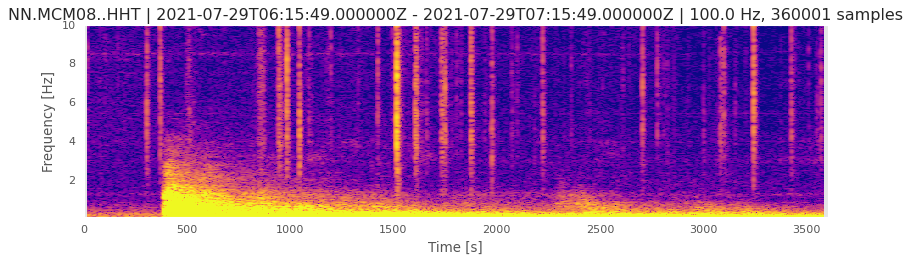

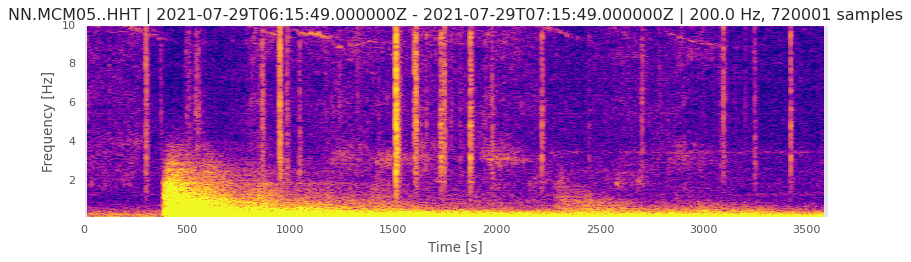

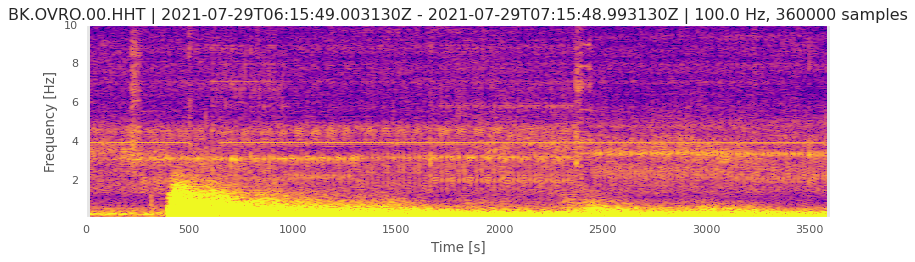

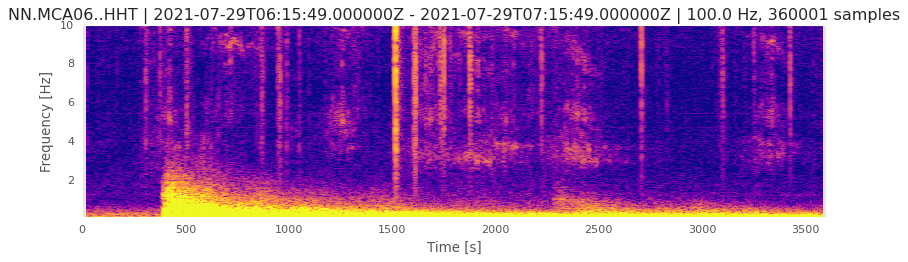

In [58]:
for i in range(len(s_t_good)):
    plt.rcParams['figure.figsize'] = 12,3
    fig = s_t_good[i].spectrogram(show=False,wlen=50,dbscale=True,cmap='plasma')
    ax = fig.axes[0]
    ax.set_ylim(0.1,10)
    #ax.set_xlim(400,800)
    im = ax.images[0]
    im.set_clim(vmin=-10,vmax=50)

#### Thats amazing! I always love the information from we can get from spectrograms. Following points can be noted <br>
1) There were several tremors that appear to occur before, during and after the surface wave arrivals <br>
2) These tremors were most clearly visible on stations MCMO8, MCM05, MCA06. station TIN also appeared to show the presence of tremors but most of them are hidden under the noise. <br>
3) Station MLAC shows very weak signals of these tremors

## I will now download the event catalog from 'NEIC' and 'ISC' and observe the seismicity before, during and after the origin of Chignik earthquake <br>

We will lookout for following-
1) Was there any earthquake swarm going on just before the Chignik earthquake? <br>
2) Was there any delayed response? <br>
3) Are the events we observed above present in the seismicity catalog?

In [83]:
t1 = UTCDateTime("2021-07-29T05:00:00")
client = Client('IRIS')
cat = client.get_events(starttime=t1, endtime=t1+3*3600, minmagnitude=0,latitude=stn_lats[0],longitude=stn_lons[0],minradius=0,maxradius=1)
cat1 = client.get_events(starttime=t1-12*3600, endtime=t1+12*3600, minmagnitude=0,latitude=stn_lats[0],longitude=stn_lons[0],minradius=0,maxradius=1)

In [29]:
print(cat.__str__(print_all=True))

8 Event(s) in Catalog:
2021-07-29T07:16:41.270000Z | +38.487, -119.549 | 1.5 ml
2021-07-29T07:06:43.394000Z | +38.532, -119.524 | 1.7 ml
2021-07-29T07:06:08.566000Z | +38.512, -119.525 | 1.6 ml
2021-07-29T06:00:29.260000Z | +38.544, -119.530 | 1.85 Md
2021-07-29T05:55:33.923000Z | +38.540, -119.509 | 1.3 ml
2021-07-29T05:16:49.231000Z | +38.453, -119.506 | 0.5 ml
2021-07-29T05:11:55.292000Z | +38.567, -119.464 | 0.9 ml
2021-07-29T05:01:54.940000Z | +38.569, -119.457 | 1.65 Md


Text(0.5, 1.0, 'Seismicity near Long Valley Caldera')

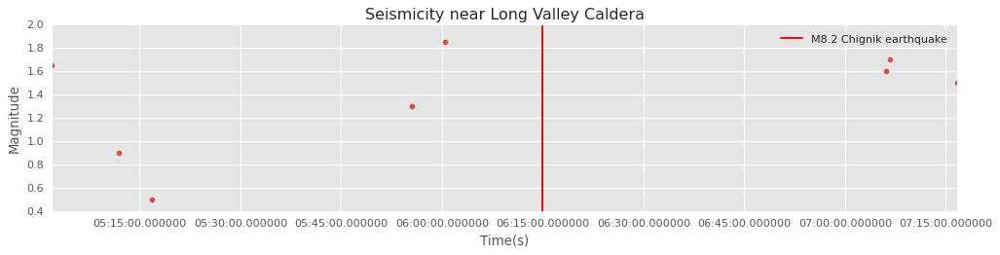

In [66]:
import matplotlib.dates as mdates
ev_lats = []
ev_lons = []
ev_depths = []
mags_1 = []
times = []
for event in cat:
    ev_lats.append(event.origins[0].latitude)
    ev_lons.append(event.origins[0].longitude)
    ev_depths.append(event.origins[0].depth)
    mags_1.append(event.magnitudes[0].mag)
    times.append(event.origins[0].time)
mags_1 = np.array(mags_1)
ev_depths = np.array(ev_depths)
times = mdates.date2num(times)

fig1 = plt.subplots(1,1,figsize=[15,3])
plt.plot_date(times,mags_1,marker='.',MarkerSize=10)
plt.xlabel('Time(s)')
plt.ylabel('Magnitude')
plt.axvline(mtimes1,color='r',label='M8.2 Chignik earthquake')
plt.legend()
plt.title('Seismicity near Long Valley Caldera')

### Ok. So it seems like the several tremors that we were seeing in the spectrograms are not present in the catalog. There is also no sign of any rigorous swarm activity before/after the event. 
#### Let's look at the event catalog of 12 hours before and after the event

Text(0.5, 1.0, 'Seismicity near Geysers')

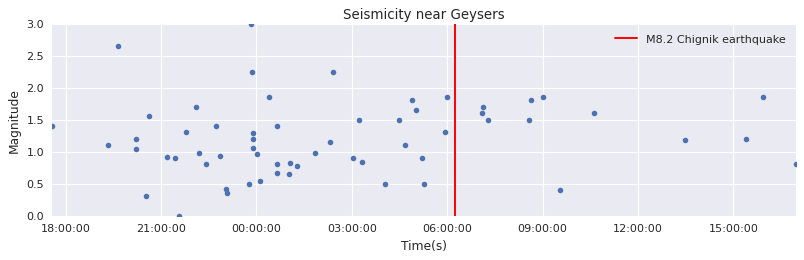

In [31]:
times = []
mags =[]
for event in cat1:
    times.append(event.origins[0].time)
    mags.append(event.magnitudes[0].mag)
    
import matplotlib.dates as mdates
mtimes = mdates.date2num(times)
ev_o_time = UTCDateTime(2021,7,29,6,15,0)
mtimes1 = mdates.date2num(ev_o_time)
plt.style.use('seaborn')


fig1 = plt.subplots(1,1,figsize=[12,3])
plt.plot_date(mtimes,mags,marker='.',MarkerSize=10)
plt.xlabel('Time(s)')
plt.ylabel('Magnitude')
plt.axvline(mtimes1,color='r',label='M8.2 Chignik earthquake')
plt.legend()
plt.title('Seismicity near Geysers')

## It seems like the seismicity decreased after the event.


#### Calculating probability of number of earthquakes happening in a given hour assuming Poisson distribution

In [98]:
from numpy import math
from math import factorial as fact
mean = len(cat1)/24 ## No. of earthquakes per hour
e = 2.718
p = []
for i in range(10):
    p.append(((mean)**(i))*(e**(-mean))/fact(i))


Text(0.5, 0, 'Number of events in the given hour')

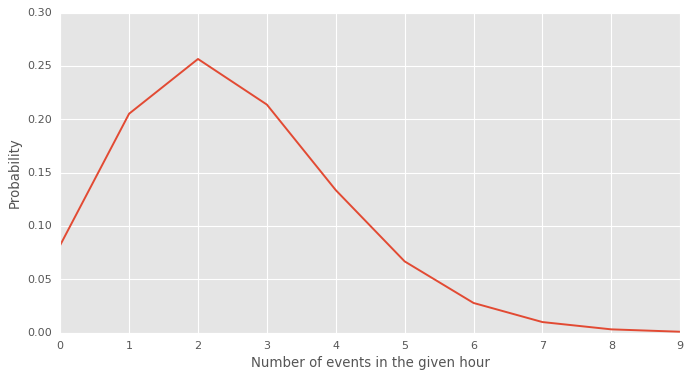

In [100]:
plt.figure(figsize=[10,5])
plt.plot(p)
plt.ylabel('Probability')
plt.xlabel('Number of events in the given hour')

### it is fairly possible to have  5 events in the given hour with 5% probability so we cannot say if the Chignik earthquake triggered any volcanic activity or there was a previous ongoing earthquake swarm

In [35]:
import pygmt

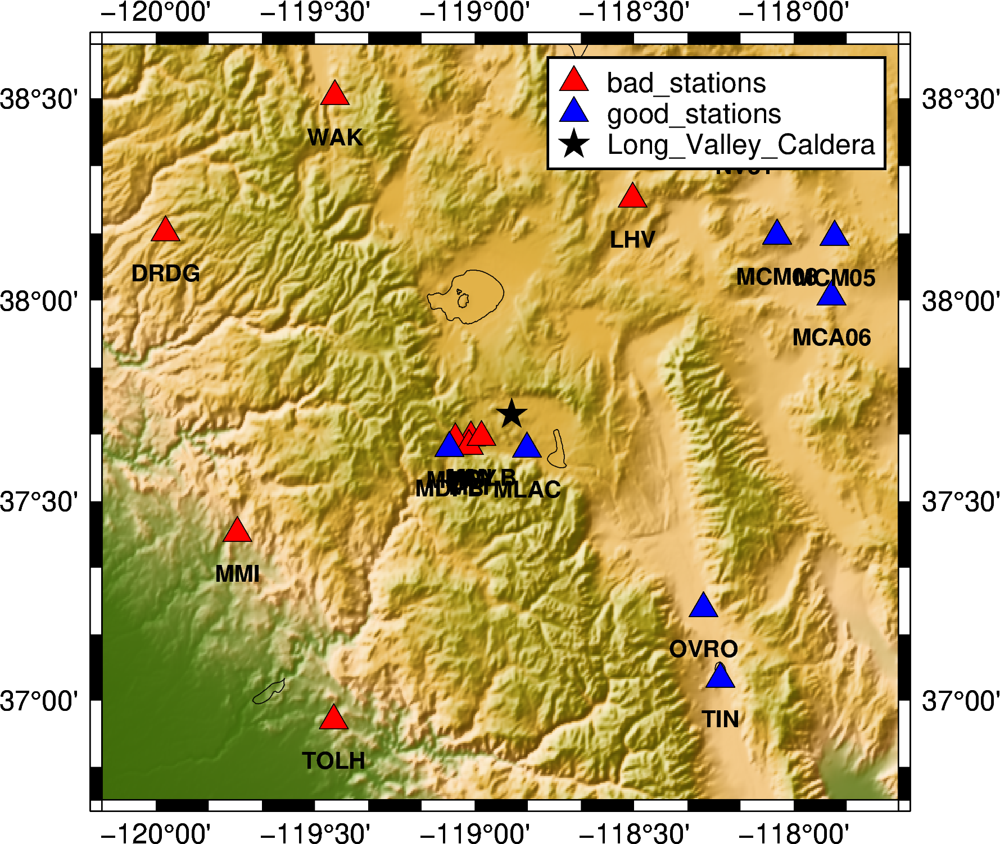

In [68]:
## Salcha earthquake
plt.rcParams['figure.figsize'] = 10,10
region=[np.min(stn_lons)-0.2,np.max(stn_lons_good)+0.2,np.min(stn_lats)-0.2,np.max(stn_lats_good)+0.2]
fig = pygmt.Figure()


pygmt.makecpt(cmap='etopo1',series='-10000/10000/1000',continuous=True)

topo_data = '@earth_relief_15s'
mag_size = 0.01 *2** mags_1

fig.grdimage(grid=topo_data,region=region,projection='M12c',shading=True,frame=True)
pygmt.makecpt(cmap="viridis", series=[np.min(ev_depths/1000), np.max(ev_depths/1000)])
fig.coast(
    shorelines=True,
    frame=True,)

fig.plot(
    x=stn_lons,
    y=stn_lats,
    style= 't0.5c',
    color = 'red',
    pen='black',
    label=f'bad_stations',
)


fig.plot(
    x=stn_lons_good,
    y=stn_lats_good,
    style='t0.5c',
    color='blue',
    pen='black',
    label=f'good_stations',
)

font = "10p,Helvetica-Bold,black"

stn_lats = np.array(stn_lats)
stn_lons = np.array(stn_lons)
#for i in range(len(stns[i])):
fig.text(text=stns,x=stn_lons,y=stn_lats-0.1,font=font)


fig.plot(x=lon,y=lat,style='a0.5c',color='black',label=f'Long_Valley_Caldera')
#fig.colorbar(frame='af+l"Depth (km)"')

fig.legend()
fig.show()

### It appears like a swarm was going on the eastern side of caldera before and after the event. There are no sign of any triggered activity on the western side. it is inconclusive that the Chignik earthquake trigger any significant seismicity in this region. 

In [79]:
client = Client('IRIS')
tr = client.get_waveforms(starttime=ev_o_time-24*3600,endtime=ev_o_time+24*3600,network='NN',channel='HH*',station='MCM08',location='',attach_response=True)


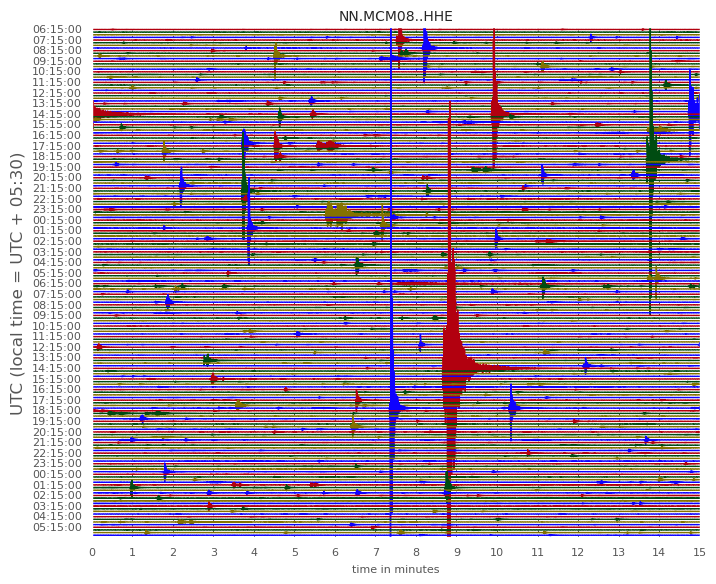

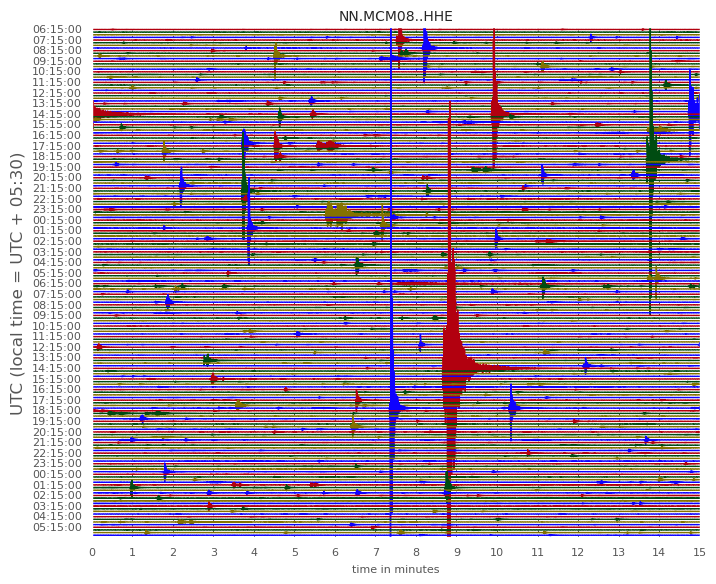

In [80]:
tr1 = tr.copy()
tr1.filter(type='bandpass',freqmin=2,freqmax=8)
tr1[0].plot(type='dayplot')

### The dayplot clearly suggests that an earthquake swarm was going on before the Chignik earthquake around the eastern side of the caldera. The swarms were effectively recorded by stations on the eastern side as can be seen in the spectrograms and filtered waveforms of these stations, whereas the station on the western side did not appear to effectively record these tremors. This indicates most of the earthquakes in the earthquake swarm were located  towards the eastern side. At the moment it is not clear if there is any contribution of Chignik earthquake in modifying the seismicity of this earthquake swarm

In [89]:
client = Client('IRIS')
tr = client.get_waveforms(starttime=ev_o_time-24*3600,endtime=ev_o_time+24*3600,network='CI',channel='HH*',station='MLAC',location='',attach_response=True)


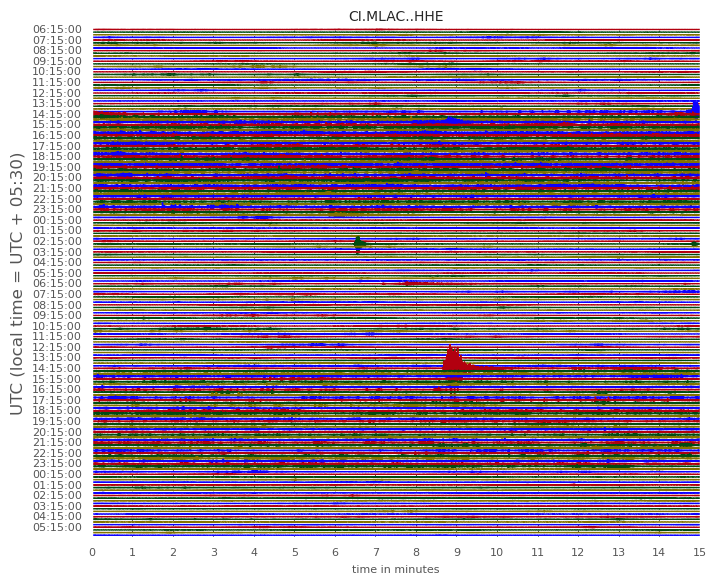

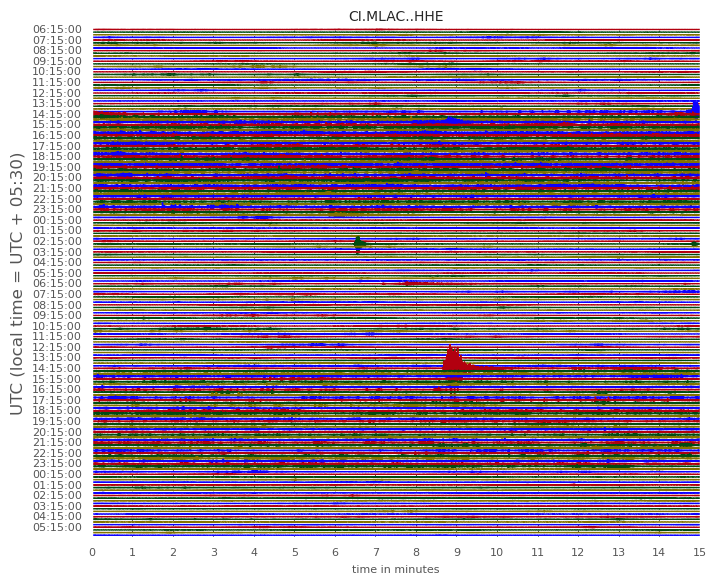

In [90]:
tr1 = tr.copy()
tr1.filter(type='bandpass',freqmin=2,freqmax=8)
tr1[0].plot(type='dayplot')